### Step 5 - Modeling

In [1]:
!pip install folium


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from geopy.distance import geodesic

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.preprocessing import PolynomialFeatures, StandardScaler


from imblearn.over_sampling import SMOTE 
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score, confusion_matrix, recall_score, precision_score, roc_curve, f1_score

%matplotlib inline
%config InlineBackend.figure_format = 'retina' # Render high resolution images

import pickle

import folium
from folium.plugins import MarkerCluster, HeatMapWithTime, HeatMap
from geopy.distance import geodesic
from branca.element import Figure

import warnings
warnings.filterwarnings("ignore")

In [3]:
train = pd.read_csv("../data/train.csv")
train_merged_df = pd.read_csv('../data/train_merged.csv')

In [4]:
# create features matrix (X)
X = train_merged_df.drop(["WnvPresent"], axis=1)

# create target vector (y)
y = train_merged_df["WnvPresent"]
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.3,stratify=y, random_state=42)

In [5]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(7295, 33)
(3127, 33)
(7295,)
(3127,)


### Addressing the target class imbalance using SMOTE sampling
SMOTE (Synthetic Minority Oversampling Technique) is an oversampling technique that generates synthetic samples from the minority class. It is used to obtain a synthetically class-balanced or nearly class-balanced training set, which is then used to train the classifier.

In [6]:
# show class imbalance
print(y_train.value_counts(normalize=True))

0    0.947087
1    0.052913
Name: WnvPresent, dtype: float64


In [7]:
# create function to run model with standard scaling, SMOTE sampling, 
# with an option to run grid search, model and print results

def run_model(mod, mod_params={}, grid_search=False):
    
    # Initial dictionary to hold model results
    results = {}
    
    pipe = Pipeline([
            ('ss', StandardScaler()),
            (mod, models[mod])
            ])
    
    if grid_search:
        # Instantiate list to store gridsearch results
        gs = GridSearchCV(pipe, param_grid=mod_params, cv=3, verbose=1, scoring='roc_auc', n_jobs=-1)
        gs.fit(X_train, y_train)
        pipe = gs
    else:
        pipe.fit(X_train, y_train)
        

    # Retrieve metrics
    predictions = pipe.predict(X_test)
    tn, fp, fn, tp = confusion_matrix(y_test, predictions).ravel()
    y_test_pred_prob = pipe.predict_proba(X_test)[:,1]
    y_train_pred_prob = pipe.predict_proba(X_train)[:,1]
    auc_scores = cross_val_score(pipe, X_train, y_train,  scoring='roc_auc', cv = 5)

    results['model'] = mod
    
    results['train_auc_cv'] = auc_scores.mean()
    
    results['f1'] = f1_score(y_test, predictions)
    results['recall'] = recall_score(y_test, predictions)        # % OF ACTUAL positives that are CORRECTLY predicted
    results['precision'] = precision_score(y_test, predictions)  # % OF positives that are CORRECTLY predicted

    results['train_auc'] = roc_auc_score(y_train, y_train_pred_prob)
    results['test_auc'] = roc_auc_score(y_test, y_test_pred_prob)
    results['auc_diff'] = results['train_auc'] - results['test_auc']

    if grid_search:
        gs_list.append(results)
        print('### BEST PARAMS ###')
        display(pipe.best_params_)
        
    else:
        init_list.append(results)

    return pipe

In [8]:
X_train_copy = X_train.astype(float).copy()
y_train_copy = y_train.astype(float).copy()


# create loop to run SMOTE sampling and compare the modelling outcomes with and without it
for k in ['No', 'SMOTE']:
    print('\nMethod Used: {}'.format(k + ' sampling'), "-" * 100)
        
    print('\nClass Balance BEFORE')
    display(y_train.value_counts(normalize=True))
    print('Number of rows: {}'.format(y_train.shape[0]))
  
    # instiantiate the models
    methods = {'SMOTE': SMOTE(random_state=42)}
    
    if k == 'SMOTE':
        mthd = methods[k]
        X_train, y_train = mthd.fit_resample(X_train, y_train)

    print('\nClass Balance AFTER')
    display(y_train.value_counts(normalize=True))
    print('Number of rows: {}'.format(y_train.shape[0]),'\n')
    
    
    # Instiantiate models
    models = {'lr': LogisticRegression(max_iter=5_000, random_state=42, solver='saga'),
              'rf': RandomForestClassifier(random_state=42),
              'gb': GradientBoostingClassifier(random_state=42),
              'dt': DecisionTreeClassifier(random_state=42),
              'et': ExtraTreesClassifier(random_state=42),
              'ada': AdaBoostClassifier(random_state=42),
              'svc': SVC(random_state=42, probability=True),
            }

    # Instantiate lists to store results
    init_list = []
    gs_list = []

    for m in models:
        run_model(m)
    result_df = pd.DataFrame(init_list).sort_values(by=["f1"], ascending=False).reset_index(drop=True)
    display(result_df)

    X_train = X_train_copy
    y_train = y_train_copy


Method Used: No sampling ----------------------------------------------------------------------------------------------------

Class Balance BEFORE


0    0.947087
1    0.052913
Name: WnvPresent, dtype: float64

Number of rows: 7295

Class Balance AFTER


0    0.947087
1    0.052913
Name: WnvPresent, dtype: float64

Number of rows: 7295 



,model,train_auc_cv,f1,recall,precision,train_auc,test_auc,auc_diff
0,rf,0.767563,0.107143,0.072727,0.20339,0.943761,0.749228,0.194533
1,dt,0.734981,0.104265,0.066667,0.23913,0.944540,0.710449,0.234092
2,et,0.734896,0.102804,0.066667,0.22449,0.944540,0.708432,0.236108
3,lr,0.832773,0.000000,0.000000,0.00000,0.843867,0.813180,0.030687
4,gb,0.855704,0.000000,0.000000,0.00000,0.902317,0.848950,0.053367
5,ada,0.850752,0.000000,0.000000,0.00000,0.879293,0.839028,0.040265
6,svc,0.755371,0.000000,0.000000,0.00000,0.840362,0.747608,0.092754



Method Used: SMOTE sampling ----------------------------------------------------------------------------------------------------

Class Balance BEFORE


0.0    0.947087
1.0    0.052913
Name: WnvPresent, dtype: float64

Number of rows: 7295

Class Balance AFTER


0.0    0.5
1.0    0.5
Name: WnvPresent, dtype: float64

Number of rows: 13818 



,model,train_auc_cv,f1,recall,precision,train_auc,test_auc,auc_diff
0,gb,0.976015,0.307414,0.515152,0.219072,0.978638,0.838703,0.139935
1,ada,0.962785,0.296830,0.624242,0.194707,0.963730,0.838129,0.125600
2,svc,0.956687,0.279946,0.630303,0.179931,0.962093,0.830116,0.131977
3,rf,0.978609,0.249423,0.327273,0.201493,0.988916,0.755157,0.233759
4,et,0.975142,0.248244,0.321212,0.202290,0.989727,0.707994,0.281733
5,dt,0.974081,0.247664,0.321212,0.201521,0.989727,0.712713,0.277015
6,lr,0.858100,0.230088,0.787879,0.134715,0.861068,0.815439,0.045629


Based on the metric scores in the tables above, the SMOTE sampling proved to be superior to not doing any sampling of the data with a strong class imbalance. We proceed to select and evaluate the models based on the scores generated using SMOTE sampling.

## Model Selection & Evaluation

We select the best model based on the following metrics:
- cross-validated ROC AUC score; 
- recall score; and 
- precision score.

### The AdaBoosting Classifier performed the best.

Although the Gradient Boosting model has the strongest ROC AUC score, its recall score (0.527) pales in comparison to that of Adaboost (0.606). This means that we are likely to have fewer False Negatives using Adaboost. 

Support Vector Classification is also a possible consideration, but it fared worse in terms of the ROC AUC score and precision score compared to Adaboost.

AdaBoost seems like the best model for this use case as it is important to ensure a relatively high recall score that does not overly compromise the ROC AUC and precision score. 

In [9]:
print('\nClass Balance BEFORE')
display(y_train.value_counts(normalize=True))
print('Number of rows: {}'.format(y_train.shape[0]))

# instiantiate the SMOTE sampling method 
sm = SMOTE(random_state=42)  
X_train, y_train = sm.fit_resample(X_train, y_train)

print('\nClass Balance AFTER')
display(y_train.value_counts(normalize=True))
print('Number of rows: {}'.format(y_train.shape[0]),'\n')

# instantiate lists to store results
gs_list = []

# run the gridsearch using the function that was defined earlier
ada_best = run_model('ada', 
          mod_params={
              'ada__learning_rate': [1, 0.5, 0.25, 0.1, 0.05, 0.01],
              'ada__n_estimators' : [1, 2, 4, 8, 16, 32, 64, 100, 200],
              'ada__algorithm' :['SAMME', 'SAMME.R']
          },
          grid_search=True)
    
X_train = X_train_copy
y_train = y_train_copy 


Class Balance BEFORE


0.0    0.947087
1.0    0.052913
Name: WnvPresent, dtype: float64

Number of rows: 7295

Class Balance AFTER


0.0    0.5
1.0    0.5
Name: WnvPresent, dtype: float64

Number of rows: 13818 

Fitting 3 folds for each of 108 candidates, totalling 324 fits
Fitting 3 folds for each of 108 candidates, totalling 324 fits
Fitting 3 folds for each of 108 candidates, totalling 324 fits
Fitting 3 folds for each of 108 candidates, totalling 324 fits
Fitting 3 folds for each of 108 candidates, totalling 324 fits
Fitting 3 folds for each of 108 candidates, totalling 324 fits
### BEST PARAMS ###


{'ada__algorithm': 'SAMME.R',
 'ada__learning_rate': 1,
 'ada__n_estimators': 200}

### The key metric scores of the chosen AdaBoosting Classifier model are summarised below:

In [10]:
ada_result_df = pd.DataFrame(gs_list).reset_index(drop=True)
display(ada_result_df)

,model,train_auc_cv,f1,recall,precision,train_auc,test_auc,auc_diff
0,ada,0.972746,0.285714,0.490909,0.201493,0.974581,0.844172,0.130409


In [11]:
# create a function to plot the confusion matrix

def plot_confusion_matrix(y_test, test_preds):
    cm = confusion_matrix(y_test, test_preds)
    modified_cm = []
    for index,value in enumerate(cm):
        if index == 0:
            modified_cm.append(['TN = ' + str(value[0]), 'FP = ' + str(value[1])])
        if index == 1:
            modified_cm.append(['FN = ' + str(value[0]), 'TP = ' + str(value[1])])

    TN, FP, FN, TP = cm.ravel()

    print("Precison: {:.3f} (TP / (TP + FP))".format(TP / (TP + FP)))
    print("Recall: {:.3f} (TP / (TP + FN))".format(TP / (TP + FN)))
    print("F1 Score: {:.3f} (2*TP / (2*TP + FN + FP))".format(2*TP / (2*TP + FN + FP)), '\n')
    
    plt.figure(figsize=(6,6))
    sns.heatmap(cm, annot=np.array(modified_cm),
                fmt="",
                annot_kws={"size": 10},
                linewidths=.5,
                square = True,
                cmap = 'Blues',
                xticklabels = ['Virus Absent', 'Virus Present'],
                yticklabels = ['Virus Absent', 'Virus Present'],
                )

    plt.ylabel('Actual', fontsize = 10);
    plt.xlabel('Predicted', fontsize = 10);
    plt.title('Confusion Matrix of Predictions Made by \n AdaBoosting Classifier', 
          fontweight='bold', fontsize=10);
    plt.tick_params(labelsize= 8)

In [12]:
# show the best parameters for AdaBoosting
ada_best.best_estimator_

Pipeline(steps=[('ss', StandardScaler()),
                ('ada',
                 AdaBoostClassifier(learning_rate=1, n_estimators=200,
                                    random_state=42))])

In [13]:
# create table to show the predictors with the highest importance (i.e. strongest predictors of the presence of WNV)
feature_names = X.columns
coefficients = pd.DataFrame(np.squeeze(ada_best.best_estimator_.named_steps["ada"].feature_importances_),
                            columns=['Importances']) 
features = pd.DataFrame(np.squeeze(feature_names), columns=['Features']) 
df = pd.concat([features, coefficients], axis='columns').sort_values('Importances', ascending=False)
df

,Features,Importances
17,RESTUANS,0.120
20,WnvRisk_medium,0.105
16,PIPIENS,0.085
21,WnvRisk_high,0.075
19,WnvRisk_low,0.075
24,Tavg,0.070
15,Week,0.050
29,AvgSpeed,0.050
23,Tmin,0.040
4,SeaLevel_L1,0.030


Precison: 0.201 (TP / (TP + FP))
Recall: 0.491 (TP / (TP + FN))
F1 Score: 0.286 (2*TP / (2*TP + FN + FP)) 



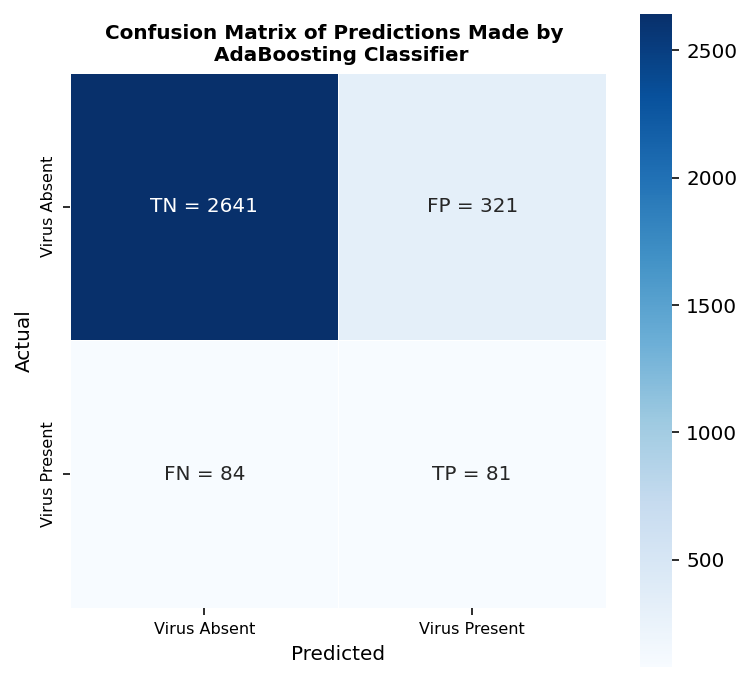

In [14]:
# plot confusion matrix
plot_confusion_matrix(y_test, ada_best.best_estimator_.predict(X_test))

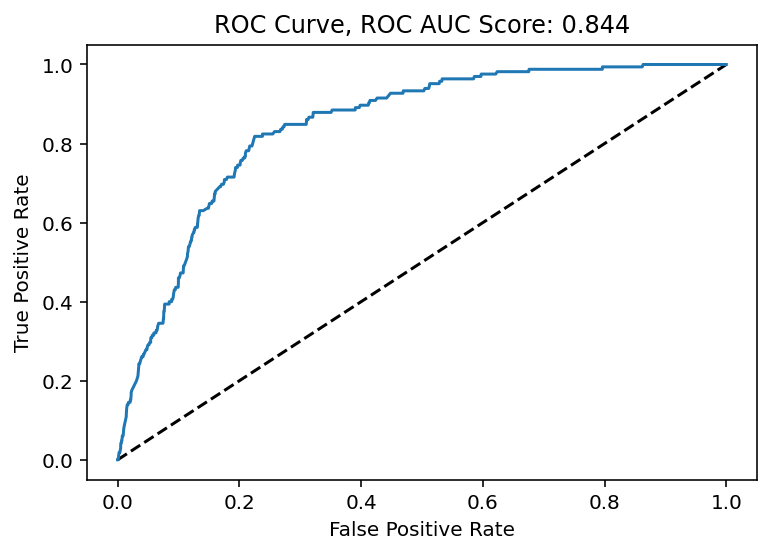

In [15]:
y_pred_prob = ada_best.best_estimator_.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Plot ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve, ROC AUC Score: {}'.format(roc_auc_score(y_test, y_pred_prob).round(3)))
plt.show()

In [16]:
# import cleaned datasets/ original Kaggle datasets 
test = pd.read_csv("../data/test.csv", parse_dates=[1])
weather = pd.read_csv("../data/weather_cleaned.csv", parse_dates=[1])

In [17]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116293 entries, 0 to 116292
Data columns (total 11 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Id                      116293 non-null  int64         
 1   Date                    116293 non-null  datetime64[ns]
 2   Address                 116293 non-null  object        
 3   Species                 116293 non-null  object        
 4   Block                   116293 non-null  int64         
 5   Street                  116293 non-null  object        
 6   Trap                    116293 non-null  object        
 7   AddressNumberAndStreet  116293 non-null  object        
 8   Latitude                116293 non-null  float64       
 9   Longitude               116293 non-null  float64       
 10  AddressAccuracy         116293 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(5)
memory usage: 9.8+ MB


In [18]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Station           2944 non-null   int64         
 1   Date              2944 non-null   datetime64[ns]
 2   Tmax              2944 non-null   int64         
 3   Tmin              2944 non-null   int64         
 4   Tavg              2944 non-null   float64       
 5   DewPoint          2944 non-null   int64         
 6   PrecipTotal       2944 non-null   float64       
 7   StnPressure       2944 non-null   float64       
 8   SeaLevel          2944 non-null   float64       
 9   AvgSpeed          2944 non-null   float64       
 10  Rain              2944 non-null   int64         
 11  Mist              2944 non-null   int64         
 12  RelativeHumidity  2944 non-null   float64       
dtypes: datetime64[ns](1), float64(6), int64(6)
memory usage: 299.1 KB


In [19]:
def assign_station(lat:int, lng:int) -> int:
    coord_stn1 = (41.995, -87.933)
    coord_stn2 = (41.786, -87.752)
    coord_curr = (lat, lng)
    return 1 if geodesic(coord_curr, coord_stn1) < geodesic(coord_curr, coord_stn2) else 2

def clean_data(data:pd.DataFrame, weather)-> pd.DataFrame:
    data['Station'] = data.apply(lambda x: assign_station(x['Latitude'], x['Longitude']), axis=1)
      
    # merging 2 datasets into 1
    df = data.merge(weather, how='left', on=['Date', 'Station'])
    return df
    
def add_date_features(df:pd.DataFrame) -> pd.DataFrame:
    if df.index.inferred_type != "datetime64":
        df = df.set_index('Date')
    df['Month'] = df.index.month
    df['Week'] = df.index.isocalendar().week
    df['Year Month'] = df.index.strftime('%Y %m')
    df['Year Month L1'] = df.index.date - pd.DateOffset(months=1)
    df['Year Month L1'] = df['Year Month L1'].dt.strftime('%Y %m')
    return df


def add_species_features(df:pd.DataFrame) -> pd.DataFrame:
    df['RESTUANS'] = np.where(df['Species'].str.lower().str.contains('restuans'), 1, 0)
    df['PIPIENS'] = np.where(df['Species'].str.lower().str.contains('pipiens'), 1, 0)
    df = df.drop(['Species'], axis='columns')
    return df

def add_weather_features(df:pd.DataFrame) -> pd.DataFrame:
    try:
        df['Rain'] = np.where(df['CodeSum'].str.contains('|'.join(['TS', 'RA', 'DZ', 'SH', 'SQ'])), 1, 0)
        df['Mist'] = np.where(df['CodeSum'].str.contains('|'.join(['BR', 'HZ', 'FG', 'FU'])), 1, 0)
        df = df.drop(['CodeSum'], axis='columns')
    except:
        return df
    return df

def add_location_features(df:pd.DataFrame) -> pd.DataFrame:
    df = wnv_risk.reset_index()[['AddressNumberAndStreet', 'WNV_risk']].merge(df, 
                                                                              how='right', on='AddressNumberAndStreet') # add risk level column
    df = pd.get_dummies(df, columns=['WNV_risk'], prefix='WnvRisk')

    return df

def add_weather_stats(df: pd.DataFrame) -> pd.DataFrame:
    # Adding Year Month columns to aggregrate weather data by year and month
    weather['Year_Month'] = weather['Date'].dt.strftime('%Y %m')
    
    # Creating a temporary pivot table to extract weather states by year month
    temp_df = pd.DataFrame(pd.pivot_table(data=weather, index=['Station','Year_Month'], 
                                          values=['Tmin', 'Tmax', 'DewPoint', 'PrecipTotal', 
                                                  'SeaLevel', 'AvgSpeed', 'RelativeHumidity'], 
                                          aggfunc='mean').to_records())
    
    # Rename temp_df columns
    old_col = temp_df.drop('Station', axis='columns').columns
    new_col = old_col + "_"
    temp_df = temp_df.rename(columns = dict(zip(old_col.tolist(), new_col.tolist())))
    
    # Assigning aggregated year month values into train_merged_df from temp_df
    for item in new_col[1:]:
        df = temp_df[['Station', 'Year_Month_', item]].merge(df, how='right', 
                                                             left_on=['Station', 'Year_Month_'], 
                                                             right_on=['Station', 'Year Month'])  \
                                                                     .rename(columns={item: item + 'L0'})  \
                                                                     .drop(['Year_Month_'], axis='columns')
        
        df = temp_df[['Station', 'Year_Month_', item]].merge(df, how='right', 
                                                             left_on=['Station', 'Year_Month_'], 
                                                             right_on=['Station', 'Year Month L1'])  \
                                                                     .rename(columns={item: item + 'L1'})  \
                                                                     .drop(['Year_Month_'], axis='columns')
        
    return df

def cleanup(df):
    df = df[(df['Year Month'] != '2007 05') & (df['Year Month'] != '2009 05')]
    df = df.drop(['Year Month', 'Year Month L1', 'AddressNumberAndStreet', 'Address', 
                  'Block', 'Street', 'Trap', 'AddressAccuracy', 'Station'], axis='columns')
    return df


def predict(df):
    df_id = df['Id']

    df_base = df.drop(['Latitude','Longitude', 'Id'], axis='columns')
    
    # generate predictions
    y_pred = ada_best.best_estimator_.predict(df_base)  

    # load prediction into dataframe
    df_pred = pd.DataFrame(np.squeeze(y_pred), columns=['WNVPresent']) 

    # Merge id with predictions into one dataframe
    df_final = pd.concat([df_id, df_pred], axis='columns')
    return df_final

def predict_proba(df):
    df_coord = df[['Latitude', 'Longitude']]
    
    df_base = df.drop(['Latitude','Longitude', 'Id'], axis='columns')
    
    # generate predictions
    y_pred = ada_best.best_estimator_.predict_proba(df_base)  

    # load prediction into dataframe
    df_pred = pd.DataFrame(np.squeeze(y_pred)) 

    # Merge id with predictions into one dataframe
    df_final = pd.concat([df_coord, df_pred], axis='columns')
    return df_final

In [20]:
# apply the preprocessing functions on the test data
wnv_risk = train.pivot_table(values=['WnvPresent'], index='AddressNumberAndStreet', aggfunc='sum')
wnv_risk['WNV_risk'] = pd.cut(wnv_risk["WnvPresent"], bins=[0, 2, 6, 10, 100], right=False, labels=['very low', 'low', 'medium', 'high'], ordered=True)
test_data = test.pipe(clean_data, weather) \
             .pipe(add_date_features) \
             .pipe(add_species_features) \
             .pipe(add_weather_features) \
             .pipe(add_location_features) \
             .pipe(add_weather_stats)  \
             .pipe(cleanup) 

test_data.info()

assert test_data.isnull().sum().sum() == 0

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116293 entries, 0 to 116292
Data columns (total 36 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Tmin_L1              116293 non-null  float64
 1   Tmin_L0              116293 non-null  float64
 2   Tmax_L1              116293 non-null  float64
 3   Tmax_L0              116293 non-null  float64
 4   SeaLevel_L1          116293 non-null  float64
 5   SeaLevel_L0          116293 non-null  float64
 6   RelativeHumidity_L1  116293 non-null  float64
 7   RelativeHumidity_L0  116293 non-null  float64
 8   PrecipTotal_L1       116293 non-null  float64
 9   PrecipTotal_L0       116293 non-null  float64
 10  DewPoint_L1          116293 non-null  float64
 11  DewPoint_L0          116293 non-null  float64
 12  AvgSpeed_L1          116293 non-null  float64
 13  AvgSpeed_L0          116293 non-null  float64
 14  Id                   116293 non-null  int64  
 15  Latitude         

In [21]:
test_data.head()

,Tmin_L1,Tmin_L0,Tmax_L1,Tmax_L0,SeaLevel_L1,SeaLevel_L0,RelativeHumidity_L1,RelativeHumidity_L0,PrecipTotal_L1,PrecipTotal_L0,...,Mist,RelativeHumidity,Month,Week,RESTUANS,PIPIENS,WnvRisk_very low,WnvRisk_low,WnvRisk_medium,WnvRisk_high
0,44.83871,60.7,66.16129,80.866667,29.864194,29.878333,61.476124,62.964004,0.132258,0.139333,...,0,54.279197,6,24,1,1,0,0,0,1
1,44.83871,60.7,66.16129,80.866667,29.864194,29.878333,61.476124,62.964004,0.132258,0.139333,...,0,54.279197,6,24,1,0,0,0,0,1
2,44.83871,60.7,66.16129,80.866667,29.864194,29.878333,61.476124,62.964004,0.132258,0.139333,...,0,54.279197,6,24,0,1,0,0,0,1
3,44.83871,60.7,66.16129,80.866667,29.864194,29.878333,61.476124,62.964004,0.132258,0.139333,...,0,54.279197,6,24,0,0,0,0,0,1
4,44.83871,60.7,66.16129,80.866667,29.864194,29.878333,61.476124,62.964004,0.132258,0.139333,...,0,54.279197,6,24,0,0,0,0,0,1


In [22]:
# generate predictions
pred = predict(test_data)
pred

,Id,WNVPresent
0,1,0.0
1,2,0.0
2,3,0.0
3,4,0.0
4,5,0.0
...,...,...
116288,116289,0.0
116289,116290,0.0
116290,116291,0.0
116291,116292,0.0


In [23]:
# generate prediction probabilities 
pred_probability = predict_proba(test_data)
pred_probability

,Latitude,Longitude,0,1
0,41.954690,-87.800991,0.646271,0.353729
1,41.954690,-87.800991,0.646271,0.353729
2,41.954690,-87.800991,0.646271,0.353729
3,41.954690,-87.800991,0.646271,0.353729
4,41.954690,-87.800991,0.646271,0.353729
...,...,...,...,...
116288,41.925652,-87.633590,0.641266,0.358734
116289,41.925652,-87.633590,0.641266,0.358734
116290,41.925652,-87.633590,0.641266,0.358734
116291,41.925652,-87.633590,0.641266,0.358734


In [24]:
# export predictions to csv
pred.to_csv('..//submission.csv', index=False)
pred_probability.to_csv('../data/prediction_probability_with_traps.csv', index=False)

## Cost Benefit Analysis of Interventions Against The West Nile Virus

In [25]:
# import cleaned datasets/ original Kaggle datasets 
spray = pd.read_csv("../data/spray_cleaned.csv")
train = pd.read_csv("../data/train.csv")

In [26]:
train['Date'] = pd.to_datetime(train['Date'])

In [27]:
spray['Date'] = pd.to_datetime(spray['Date'])

In [28]:
#2011 and 2013 spray dates
spray_2011 = spray['Date'].unique()[:1]
spray_2013 = spray['Date'].unique()[1:]

In [29]:
#2011 and 2013 wnv from train set
wnv_2011 = train[train['Date'].dt.year==2011].groupby('Date')['WnvPresent'].sum()
wnv_2013 = train[train['Date'].dt.year==2013].groupby('Date')['WnvPresent'].sum()

In [30]:
#2011 and 2013 num mosquitos from train set
mosquitos_2011 = train[train['Date'].dt.year==2011].groupby('Date')['NumMosquitos'].sum()
mosquitos_2013 = train[train['Date'].dt.year==2013].groupby('Date')['NumMosquitos'].sum()

## Graphs of the Mosquito Count vs Spray and West Nile Virus Mosquito vs Spray in 2011

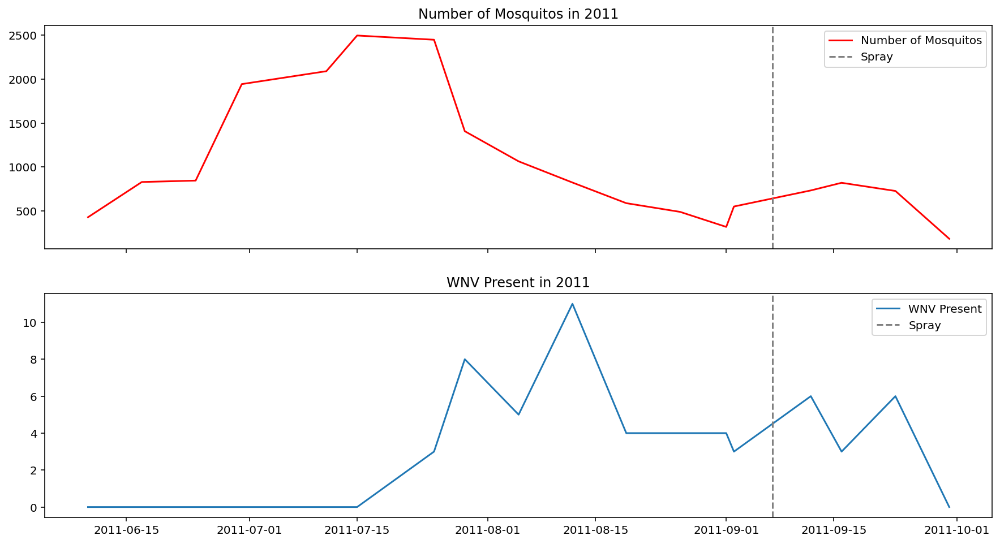

In [31]:
fig, axes = plt.subplots(nrows=2,sharex=True, figsize=(15,8))

#plot num mosquitos in 2011 against spray dates
axes[0].plot(mosquitos_2011.index,mosquitos_2011.values,color='red')
for spray_date in spray_2011:
    axes[0].axvline(x=spray_date, color='grey', ls='--')
axes[0].set_title('Number of Mosquitos in 2011')
axes[0].legend(['Number of Mosquitos','Spray']);

#plot wnv in 2011 against spray dates
axes[1].plot(wnv_2011.index,wnv_2011.values)
for spray_date in spray_2011:
    axes[1].axvline(x=spray_date, color='grey', ls='--')
axes[1].set_title('WNV Present in 2011')
axes[1].legend(['WNV Present','Spray']);

From the observations charted above, we can view that the mosquito number trends do not seem affected by the spraying efforts that were carried out

## Viewing similar graphs in 2013

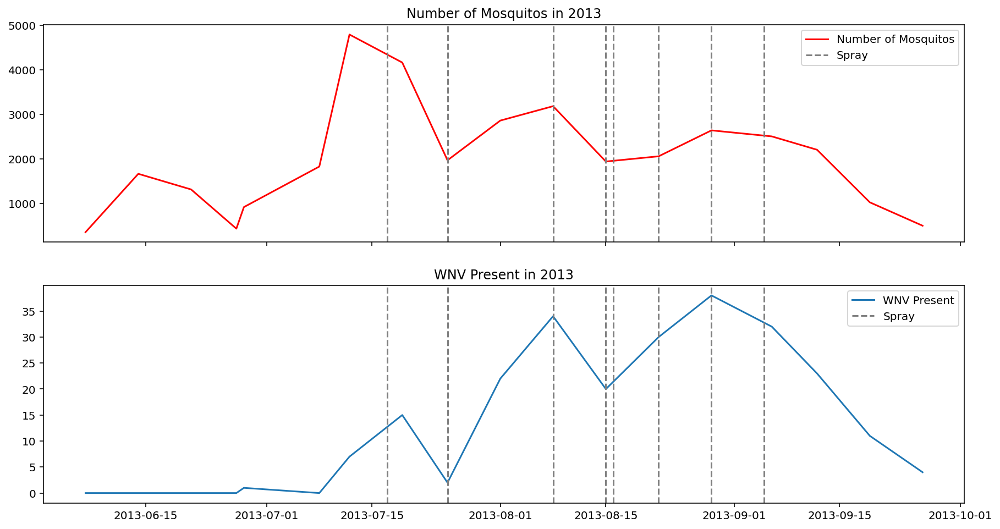

In [32]:
fig, axes = plt.subplots(nrows=2,sharex=True, figsize=(15,8))

#plot num mosquitos in 2013 against spray dates
axes[0].plot(mosquitos_2013.index,mosquitos_2013.values,color='red')
for spray_date in spray_2013:
    axes[0].axvline(x=spray_date, color='grey', ls='--')
axes[0].set_title('Number of Mosquitos in 2013')
axes[0].legend(['Number of Mosquitos','Spray']);

#plot wnv in 2013 against spray dates
axes[1].plot(wnv_2013.index,wnv_2013.values)
for spray_date in spray_2013:
    axes[1].axvline(x=spray_date, color='grey', ls='--')
axes[1].set_title('WNV Present in 2013')
axes[1].legend(['WNV Present','Spray']);

From the week of 17 July 2013, spraying seemed to affect the number of mosquitoes as there was a decrease, however, the 2nd spray onwards do not seem to affect, and the number of mosquitoes seemed to increase sharply thereafter.

Assumption points
- These graphs reflected the total mosquitos vs spray
- This may not refect the actual spraying locale. Spraying might affect the locality, but not the mosquitoes in the total area of Chicago<br>

Thus we want to plot maps to view how and whether the spraying worked

## Map

In [33]:
spray_df = pd.read_csv('../data/spray.csv')
spray_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14835 entries, 0 to 14834
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       14835 non-null  object 
 1   Time       14251 non-null  object 
 2   Latitude   14835 non-null  float64
 3   Longitude  14835 non-null  float64
dtypes: float64(2), object(2)
memory usage: 463.7+ KB


In [34]:
df = pd.read_csv('../data/train.csv')

In [35]:
# Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
# Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level
def assign_station(lat:int, lng:int):
    coord_stn1 = (41.995, -87.933)
    coord_stn2 = (41.786, -87.752)
    coord_curr = (lat, lng)
    return 1 if geodesic(coord_curr, coord_stn1) < geodesic(coord_curr, coord_stn2) else 2

    
lst = ['Trap', 'Address', 'Block', 'Street', 'AddressNumberAndStreet','Latitude', 'Longitude', 'AddressAccuracy']
dim_loc = df[lst].drop_duplicates()
dim_loc[['Overall Latitude', 'Overall Longitude']] = np.round(dim_loc[['Latitude', 'Longitude']], 3)
dim_loc['Station'] = dim_loc.apply(lambda x: assign_station(x['Latitude'], x['Longitude']), axis=1)

In [36]:
spray_df[['Overall Latitude', 'Overall Longitude']] = np.round(spray_df[['Latitude', 'Longitude']], 3)

In [37]:
dim_loc

,Trap,Address,Block,Street,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,Overall Latitude,Overall Longitude,Station
0,T002,"4100 North Oak Park Avenue, Chicago, IL 60634,...",41,N OAK PARK AVE,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,41.955,-87.801,1
2,T007,"6200 North Mandell Avenue, Chicago, IL 60646, USA",62,N MANDELL AVE,"6200 N MANDELL AVE, Chicago, IL",41.994991,-87.769279,9,41.995,-87.769,1
3,T015,"7900 West Foster Avenue, Chicago, IL 60656, USA",79,W FOSTER AVE,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,41.974,-87.825,1
5,T045,"1500 West Webster Avenue, Chicago, IL 60614, USA",15,W WEBSTER AVE,"1500 W WEBSTER AVE, Chicago, IL",41.921600,-87.666455,8,41.922,-87.666,2
6,T046,"2500 West Grand Avenue, Chicago, IL 60654, USA",25,W GRAND AVE,"2500 W GRAND AVE, Chicago, IL",41.891118,-87.654491,8,41.891,-87.654,2
...,...,...,...,...,...,...,...,...,...,...,...
7466,T236,"6200 North Mcclellan Avenue, Chicago, IL 60646...",62,N MCCLELLAN AVE,"6200 N MCCLELLAN AVE, Chicago, IL",41.994679,-87.770899,8,41.995,-87.771,1
7635,T237,"2900 West 85th Street, Chicago, IL 60652, USA",29,W 85TH ST,"2900 W 85TH ST, Chicago, IL",41.738903,-87.695443,8,41.739,-87.695,2
7821,T238,"3400 West 77th Street, Chicago, IL 60652, USA",34,W 77TH ST,"3400 W 77TH ST, Chicago, IL",41.753391,-87.707394,8,41.753,-87.707,2
8667,T094B,"9600 South Longwood Drive, Chicago, IL 60643, USA",96,S LONGWOOD DR,"9600 S LONGWOOD DR, Chicago, IL",41.719140,-87.669539,9,41.719,-87.670,2


In [38]:
#Create the base Map

from branca.element import Figure
fig=Figure(width=1100,height=900)


m = folium.Map(width=1100,height=900, location=[41.904,-87.756], tiles='cartodbpositron', zoom_start=11)
folium.Marker(location=[41.995, -87.933],tooltip="CHICAGO O'HARE INTERNATIONAL AIRPORT", icon=folium.Icon(color='black')).add_to(m)
folium.Marker(location=[41.786, -87.752],tooltip="CHICAGO MIDWAY INTL ARPT", icon=folium.Icon(color='purple')).add_to(m)

#Create the markers
#sprayCluster = MarkerCluster().add_to(m)
for i, row in spray_df.iterrows():
    lat = spray_df.at[i,'Overall Latitude']
    lng = spray_df.at[i,'Overall Longitude']
    date_sprayed = spray_df.at[i,'Date']
    popup = 'date sprayed: ' + str(date_sprayed) + '\n' + str(lat)+ '\n' + str(lng)
    folium.CircleMarker(location=[lat, lng],tooltip=popup, color='red', radius=2, fill=True, opacity=0.5, fill_opacity=0.5).add_to(m)    
    

test_df = dim_loc[dim_loc['Station'] == 1]    
#Create the markers
#stn1Cluster = MarkerCluster().add_to(m)
for i, row in test_df.iterrows():
    lat = test_df.at[i,'Overall Latitude']
    lng = test_df.at[i,'Overall Longitude']
    trap = test_df.at[i,'Trap']
    name = test_df.at[i,'AddressNumberAndStreet']
    popup = trap + '\n' + str(name) + '\n' + str(lat)+ '\n' + str(lng)
    folium.CircleMarker(location=[lat, lng],tooltip=popup,color='blue', radius=4, opacity=0.5).add_to(m)    

    
test_df = dim_loc[dim_loc['Station'] == 2]
#Create the markers
#stn2Cluster = MarkerCluster().add_to(m)
for i, row in test_df.iterrows():
    lat = test_df.at[i,'Overall Latitude']
    lng = test_df.at[i,'Overall Longitude']
    trap = test_df.at[i,'Trap']
    name = test_df.at[i,'AddressNumberAndStreet']
    popup = trap + '\n' + str(name) + '\n' + str(lat)+ '\n' + str(lng)
    folium.CircleMarker(location=[lat, lng],tooltip=popup, color='darkblue', radius=4, opacity=0.8).add_to(m)     

fig.add_child(m)
m

Sprayed Area in 2011 and 2013 vs the number of traps in Chicago area. From here, we can tell that sprayed areas seem to happen more nearer to Station 1, but it still doesn't really give us an indication of whether mosquito numbers are affected. Could it be that there are more mosquito numbers in the Northern side of Chicago compared to the Southern side?

In [39]:
# Opening previously saved train dataset
infile = open('../data/train.pkl', 'rb')
wnv = pickle.load(infile)
infile.close()

In [40]:
# View the coverage of the traps

# Create latitude and longitude list for traps in train data
lat_long_train = []

for trap in wnv['Trap'].unique():
    lat = wnv.loc[wnv['Trap'] == trap, 'Latitude'].values[0]
    long = wnv.loc[wnv['Trap'] == trap, 'Longitude'].values[0]
    lat_long_train.append([trap, (lat, long)])

In [41]:
# Create dataframe with total number of mosquitoes at each date and trap
group_mosq = wnv.groupby(['Date', 'Trap','WnvPresent'], as_index=False).sum()
group_mosq = group_mosq.loc[group_mosq['WnvPresent']==1]
group_mosq['Date_Type'] = pd.to_datetime(group_mosq['Date'])

group_mosq = group_mosq.loc[group_mosq['Date_Type'].dt.year >= 2011]
# group_mosq.head()

In [42]:
# for spray
# Create latitude and longitude list to pass into map
lat_long_spray = []
for date in spray['Date'].unique():
    temp = []
    for i, row in spray[spray['Date'] == date].iterrows():
        temp.append([row['Latitude'], row['Longitude']])
    lat_long_spray.append(temp)

In [43]:
# for number of mosquitoes
# Create latitude and longitude list to pass into map
lat_long_mosq = []
for date in group_mosq['Date'].unique():
    temp = []
    for i, row in group_mosq[group_mosq['Date'] == date].iterrows():
        temp.append([row['Latitude'], row['Longitude'], row['NumMosquitos']])
    lat_long_mosq.append(temp)

In [44]:
# Plot the map for spraying efforts
# Blue dots indicate the trap locations
fig = Figure(width=850, height=550)
m1 = folium.Map(location=[41.9, -87.7], zoom_start=9, min_zoom=9, max_zoom=11)
# tiles='cartodbdark_matter'
fig.add_child(m1)


gradient = {.33: 'blue', .66: 'green', 1: 'yellow'}
gradient2 = {.33: 'yellow', .66: 'blue', 1: 'red'}


HeatMapWithTime(lat_long_spray, index=list(np.datetime_as_string(spray['Date'].unique(), unit='D').astype('object')),radius=0.03, gradient=gradient, position='bottomright', name='spray_zones', scale_radius=True, control=True).add_to(m1)

HeatMapWithTime(lat_long_mosq, index=list(np.datetime_as_string(group_mosq['Date'].unique(), unit='D').astype('object')), gradient=gradient2, name='WnV Spread', radius=20, position='bottomright', control=True).add_to(m1)

folium.LayerControl().add_to(m1)


for item in lat_long_train:
    folium.CircleMarker(item[1], radius=1).add_to(m1)

m1

### Below shows a gif of the evolution of West Nile Virus Clusters around the trap areas vs the Yellow Sprayed Areas in the corresponding time period.

The spray is able to last for 30 days, thus we want to see the correlation between the sprayed areas and within the time period of 30 days and whether the West Nile Virus clusters are reduced. However, it seems that it might not really be the case.

![SprayVsWNV](../images/SprayvsWnV.gif "WnV")

## Predictions

In [45]:
prediction = pd.read_csv("../data/prediction_probability_with_traps.csv")

In [46]:
prediction.head(3)

,Latitude,Longitude,0,1
0,41.95469,-87.800991,0.646271,0.353729
1,41.95469,-87.800991,0.646271,0.353729
2,41.95469,-87.800991,0.646271,0.353729


In [47]:
def apply_weight(x):
    if x<0.5: return 0
    else: return 1
prediction['1'] = prediction['1'].apply(lambda x: apply_weight(x))
prediction.head(3)

,Latitude,Longitude,0,1
0,41.95469,-87.800991,0.646271,0
1,41.95469,-87.800991,0.646271,0
2,41.95469,-87.800991,0.646271,0


In [48]:
virus_present = prediction[prediction['1']==1]
virus_present = virus_present.drop_duplicates(subset = 'Trap')

In [49]:
virus_present

,Latitude,Longitude,0,1


There are 149 unique traps where the virus is predicted to be present.

In [50]:
# Plot data on map
dataplot = []
tempdata = []

for i, row in prediction.iterrows():
    dataplot.append([row['Latitude'],row['Longitude'],row['1']])
    if row['1'] != 0:
        tempdata.append([row['Latitude'],row['Longitude'],row['1']])

### Below shows the predicted hotspots of future possible West Nile Virus Clusters

In [51]:
# Plot the map for spraying efforts
# Blue dots indicate the trap locations
fig = Figure(width=850, height=550)
m2 = folium.Map(location=[41.9, -87.7], zoom_start=9, min_zoom=9, max_zoom=11)
# tiles='cartodbdark_matter'
fig.add_child(m2)


# gradient = {.33: 'yellow', .66: 'green', 1: 'red'}
# gradient2 = {.33: 'yellow', .66: 'blue', 1: 'red'}


HeatMap(tempdata,radius=10, name='predictions', control=True).add_to(m2)

# HeatMapWithTime(lat_long_mosq, index=list(np.datetime_as_string(group_mosq['Date'].unique(), unit='D').astype('object')), gradient=gradient2, name='WnV Spread', radius=20, position='bottomright', control=True).add_to(m2)

folium.LayerControl().add_to(m2)


for item in lat_long_train:
    folium.CircleMarker(item[1], radius=1,color='red').add_to(m2)

m2

In [52]:
#Save the respective maps
m.save("../maps/TrapVsSprayloc.html")
m1.save("../maps/SprayVsWnV.html")
m2.save("../maps/FuturePred.html")

## Cost-Benefit Analysis

### Spraying

The Chicago Department of Public Health (CDPH) is continuing its efforts to combat against the West Nile virus, even in [2020](https://www.chicago.gov/city/en/depts/cdph/provdrs/healthy_communities/news/2020/august/city-to-spray-insecticide-thursday-to-kill-mosquitoes0.html). The insecticide used by the CDPH is the [Zenivex E4](https://www.chicago.gov/content/dam/city/depts/cdph/Mosquito-Borne-Diseases/Zenivex.pdf). Zenivex™, is approved for use by the U.S. Environmental Protection Agency and has been widely applied to control mosquitoes in outdoor residential and recreational areas.

A typical mosquito treatment [lasts about 30 days and the spray dispersement covers up to 300ft](https://www.callnorthwest.com/2019/05/how-long-does-a-mosquito-treatment-last/).

![zenivex.jpg](../images/zenivex.jpg)

The cost of Zenivex E4 is $0.92 per acre. 

The entire city of Chicago has an area size of 606.60 km2. Chicago has very few water bodies, and the land area size totals to 588.98 km2 (145545 acres).

In [53]:
#The cost of spraying the full land size of Chicago  
chicago_spray_cost = 0.92 * 145545
chicago_spray_cost

133901.4

In [54]:
#As the effect of spraying lasts for 30 days, for a full-year coverage, spraying will need to be performed 12 times
chicago_spray_cost= chicago_spray_cost * 12
chicago_spray_cost

1606816.7999999998

Chicago only launched the data science model in [2017](https://datasmart.ash.harvard.edu/news/article/predictive-analytics-guides-west-nile-virus-control-efforts-in-chicago-1152), thus whatever basis they were operating on previously, was probably weak.

Assuming that they are not utilizing any form of data science insights, the brute-force approach would cost $1,606,816.80 yearly. 

Next, let’s calculate the cost of spraying derived from our model’s insights.

Culex mosquitoes don’t fly long distances but have been known to fly up to [2 miles (10,000 ft)](https://www.cdc.gov/mosquitoes/about/life-cycles/culex.html). 

It’s unrealistic to spray over a radius of 10,000ft. Instead, a 10% coverage would be more than enough; 1,000ft is STILL a huge radius for spraying.

In [55]:
#Area size of each trap = πr**2 
#Radius of 700ft because spraying has a 300ft dispersement coverage
trap_area = 3.14 * 700**2
trap_area

1538600.0

In [56]:
#Convert sqft to acres
trap_area = trap_area/43560
trap_area

35.321395775941234

In [57]:
#Cost required for each trap = trap_area x zenivex cost
trap_cost = trap_area * 0.92
trap_cost

32.495684113865934

In [58]:
#Total cost = [cost of each trap] x [number of traps] x [number of sprayings]
#The model predicted 149 unique traps where the virus is present
total_cost = trap_cost * 149 * 12
total_cost

58102.28319559229

In [59]:
spray_savings = chicago_spray_cost - total_cost
spray_savings

1548714.5168044076

Referring to the map that shows the spraying efforts in 2011 and 2013, we can see that the CDPH did NOT spray the entire city of Chicago once every month. 

However, in the spraying cost analysis, we assumed that the CDPH is operating with no insights. As such, we explored the comparison between the potential decision-making derived from the model's prediction, against a baseline scenario where there are no insights to work with.

In this context, a 96%($1,548,714.51) cost savings will be achieved for spraying efforts. 

### Hospitalization and Lost Productivity

From 1999 through 2012, health care expenses and lost productivity in the US totalled up to $800 million. 

Out of the 37,088 WNV cases, 1,529 (4%) died and an estimated 18,313 (49%) of the total cases were hospitalized.

[Below is a table that shows the cost breakdown upon contracting the WNV](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3322011/).

![hospital_cost.jpg](../images/hospital_cost.jpg)

As shown above, different severities of the WNV will result in varying treatment costs. 

Back in 2002, Chicago suffered its first, and most severe, WNV epidemic: [225 human cases were reported, including 22 fatalities](https://www.cityofchicago.org/dam/city/depts/cdph/comm_dis/general/Communicable_Disease/CD_CDInfo_Jun07_WNV.pdf).

Assuming only the initial costs and the cases with just fever (mean = $7,500), the estimated yearly hospitalization costs in Chicago are AT LEAST:

In [60]:
#$7,500 as a minimum cost
#225 potential cases
hospitalization = 7500 * 225
hospitalization

1687500

Through our model, we are confident to predict 60% of the WNV (based on the recall score of 0.606). By deploying interventions to eradicate carrier mosquitos or to notify potential infected citizens for early treatment, we would be able to save ~$1,000,000 on initial hospitalization costs.

## Conclusions & Recommendations

Although the Gradient Boosting model has the strongest ROC AUC score, its recall score (0.527) pales in comparison to that of Adaboost (0.606). This means that we are likely to have fewer False Negatives using Adaboost.

Support Vector Classification is also a possible consideration, but it fared worse in terms of the ROC AUC score and precision score compared to Adaboost.

AdaBoost, with a test AUC of 0.837 and recall score of 0.606, seems like the best model as it is important to ensure a relatively high recall score that does not compromise the ROC AUC and/or precision score.

Our model was able to achieve significant cost-savings. However, the WNV prediction rate could be better. More data points would be helpful.

The cost analysis was over-simplified and not performed on a macro level. For example, the cost calculation on spraying did not account for logistics / manhour costs. Some traps were within a 700ft radius between one another; the spraying of traps overlaps and the actual required insecticide is less. In addition, the cost calculation for hospitalization fees was also generalized. To perform a proper cost analysis, we would need to look at the most recent data for an accurate assessment of the current status. Only then can a fair comparison be made.

In addition, understanding the CDPH's basis of operations will also help in bridging the current situation towards their desired KPIs. They mentioned about other efforts including larviciding catch basins, which involves dropping tablets in storm drains along the public way that slowly dissolve over a five-month period to prevent mosquito larvae from hatching, and eliminating standing water by ensuring that swimming pools and construction sites are regularly maintained. These additional efforts beyond spraying and trapping could be explored, and data can be collected on those variables to build a more robust model.